In [1]:
import json
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
import numpy as np


In [2]:
with open("observability.json", "r") as f:
    data = json.load(f)

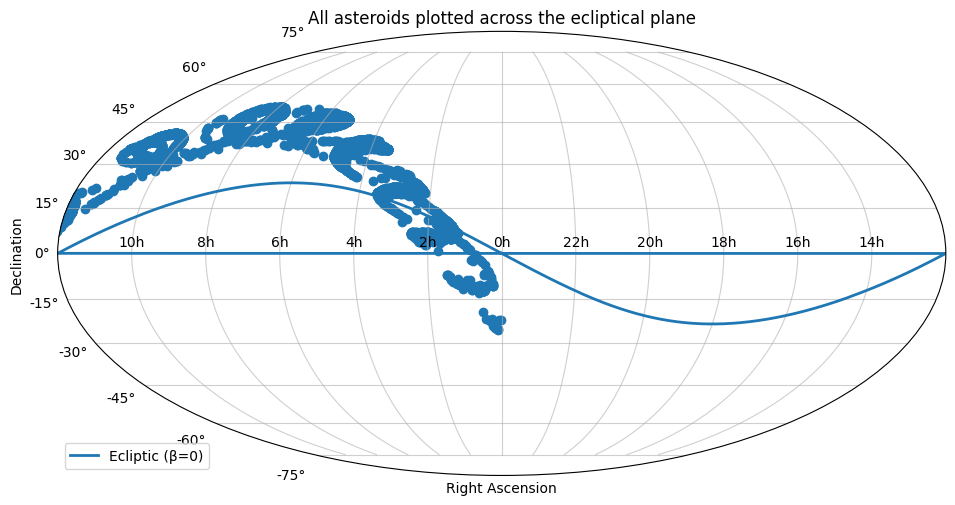

[ 0.00000000e+00  1.44153815e-03  2.88307742e-03 ... -2.88307742e-03
 -1.44153815e-03 -2.24718313e-16] [ 0.00000000e+00  6.24982645e-04  1.24996399e-03 ... -1.24996399e-03
 -6.24982645e-04 -9.74272606e-17]


In [9]:
mpcnum = '154'

data_array = data[mpcnum]
data_array = np.array(data[mpcnum]).astype(object)
ras= data_array[:,2].astype(float)
decs = data_array[:,3].astype(float)

# --- Ecliptic (β=0) -> Equatorial (RA, Dec) using mean obliquity ---
eps_deg = 23.43928  # obliquity of the ecliptic (deg), good enough for plotting
eps = np.deg2rad(eps_deg)

lam = np.linspace(0, 2*np.pi, 4000)  # ecliptic longitude λ
# For β=0:
dec = np.arcsin(np.sin(eps) * np.sin(lam))
ra  = np.arctan2(np.sin(lam) * np.cos(eps), np.cos(lam))  # range [-pi, pi]
#ra = np.rad2deg(ra)
#dec = np.rad2deg(dec)
# --- Matplotlib Mollweide wants lon in [-pi, pi], lat in [-pi/2, pi/2]
# Convert RA so it increases to the left (astronomy convention)
x = -ra  # flip so RA increases to the left

# --- Plot ---
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot(111, projection="mollweide")

ax.plot(x, dec, lw=2, label="Ecliptic (β=0)")

# RA tick labels in hours (0h..22h) with Mollweide x in [-pi, pi]
xticks = np.deg2rad(np.array([-150, -120, -90, -60, -30, 0, 30, 60, 90, 120, 150]))
# Because we flipped x = -ra, these correspond to RA labels reversed:
# Standard choice: show 10h, 8h, ..., 14h etc. A common, clear set:
ax.set_xticks(xticks)
ax.set_xticklabels(["10h","8h","6h","4h","2h","0h","22h","20h","18h","16h","14h"])

ax.grid(True, alpha=0.6)
ax.set_xlabel("Right Ascension")
ax.set_ylabel("Declination")
ax.legend(loc="lower left")
plt.tight_layout()
plt.scatter(- np.deg2rad(ras), np.deg2rad(decs))
plt.title("All asteroids plotted across the ecliptical plane")
plt.savefig("Ecliptic_plane_image.jpg", dpi=600)
plt.show()

print(ra, dec)


In [4]:
mpcnum = '154'

print(len(data[mpcnum]),"entries found")
data[mpcnum]

flat = [x for sub in full_list for x in years]

5649 entries found


NameError: name 'full_list' is not defined

To obtain the plate: b02312

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


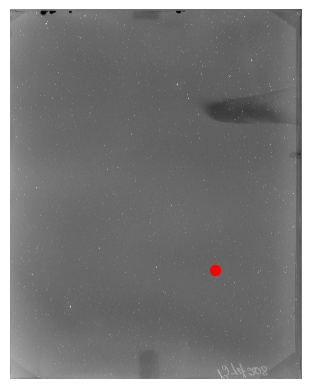

In [ ]:


file_path = "image.fit.fz"
ra = 351.90682022951216
dec = -26.941563733499343 #I used these specific values, I assume we'll have to move eventually to a loop

hdul = fits.open(file_path)

image_data = hdul[1].data


wcs_2d = WCS(hdul[1].header)

# Convert RA/Dec to pixel coordinates
x, y = wcs_2d.world_to_pixel_values(ra, dec)

# Plot
plt.imshow(image_data, origin='lower', cmap='gray')
plt.scatter(x, y, c='red', s=50)
plt.axis('off')
plt.show()



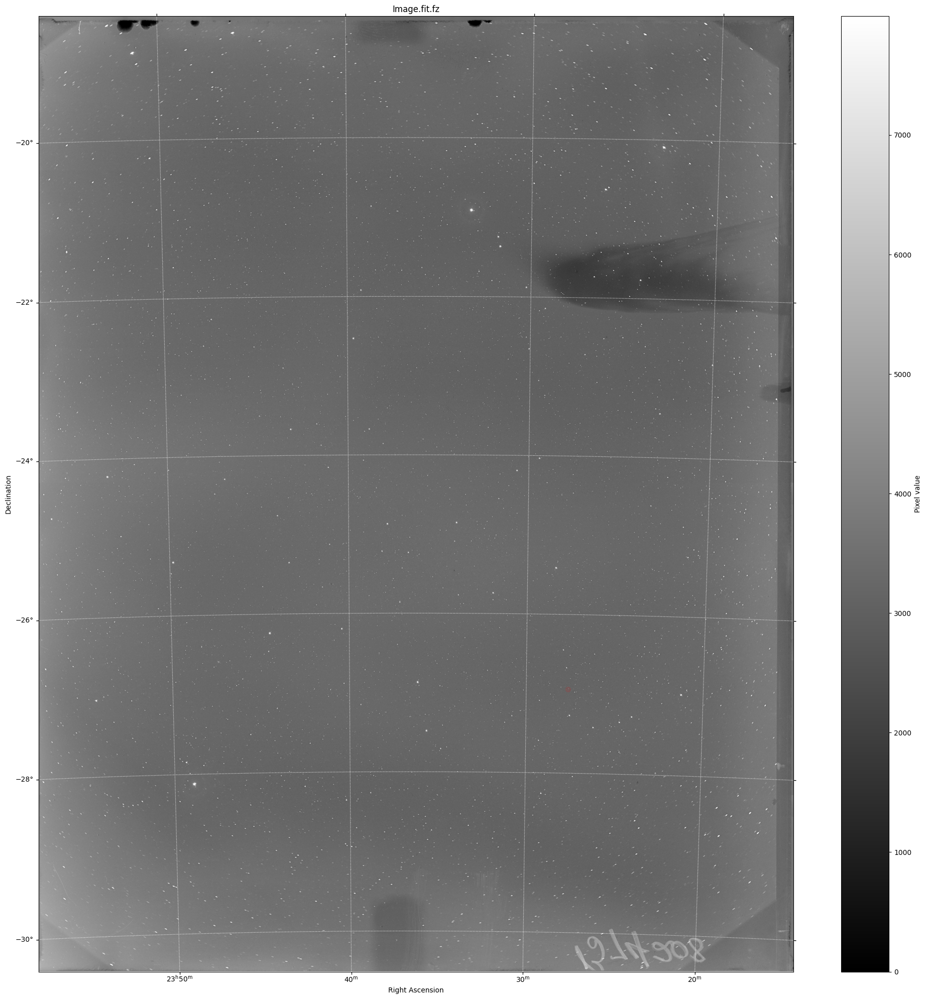

In [ ]:

ra = 351.90682022951216
dec = -26.941563733499343
file_path = "image.fit.fz" #Changes for every asteroid
 

hdul = fits.open(file_path)

wcs_2d = WCS(hdul[1].header)

image_data = hdul[1].data



# Convert RA/Dec to pixel coordinates
x, y = wcs_2d.world_to_pixel_values(ra, dec)

fig = plt.figure(figsize=(20, 20))

ax = plt.subplot(projection=wcs_2d)

im = ax.imshow(image_data,origin='lower',cmap='gray')

ax.set_xlabel('Right Ascension')

ax.set_ylabel('Declination') 

ax.coords.grid(color='white', ls='dotted')
# Plot
plt.scatter(x, y, c='red', s=50, alpha = 0.1)
plt.colorbar(im, ax=ax, label='Pixel value')
plt.title("Image.fit.fz")

plt.tight_layout()
plt.savefig("bbb.png", dpi=600)
plt.show()








the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
/var/folders/c5/4r_jvw5161b_6dvp_6v7p4qm0000gn/T/ipykernel_92615/981015999.py:28: UserWarning: Adding colorbar to a different Figure <Figure size 2000x2000 with 2 Axes> than <Figure size 2000x2000 with 2 Axes> which fig.colorbar is called on.
  plt.colorbar(im, ax=ax, label='Pixel value')


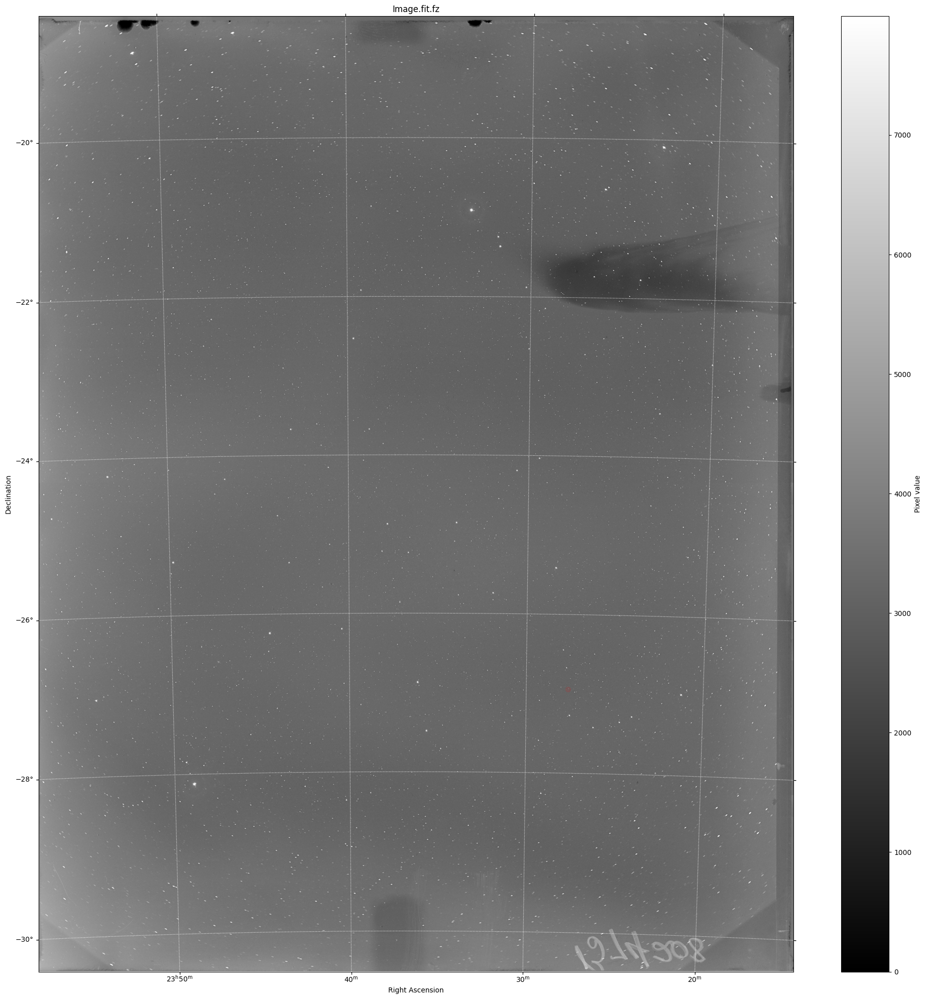

In [ ]:

ra = 351.90682022951216
dec = -26.941563733499343
file_path = "image.fit.fz" #These values change for every asteroid
 

hdul = fits.open(file_path)

wcs_2d = WCS(hdul[1].header)

image_data = hdul[1].data


# Convert RA/Dec to pixel coordinates
x, y = wcs_2d.world_to_pixel_values(ra, dec)

fig = plt.figure(figsize=(20, 20))

ax = plt.subplot(projection=wcs_2d)

ax.set_xlabel('Right Ascension')

ax.set_ylabel('Declination') 

ax.coords.grid(color='white', ls='dotted')
# Plot
plt.imshow(image_data, origin='lower', cmap='gray')
plt.scatter(x, y, c='red', s=50, alpha = 0.1)
plt.colorbar(im, ax=ax, label='Pixel value')
plt.title("Image.fit.fz")

plt.tight_layout()
plt.savefig("aaa.png", dpi=600)
plt.show()

### Example 2

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
/var/folders/c5/4r_jvw5161b_6dvp_6v7p4qm0000gn/T/ipykernel_92615/1887226407.py:28: UserWarning: Adding colorbar to a different Figure <Figure size 2000x2000 with 2 Axes> than <Figure size 2000x2000 with 2 Axes> which fig.colorbar is called on.
  plt.colorbar(im, ax=ax, label='Pixel value')


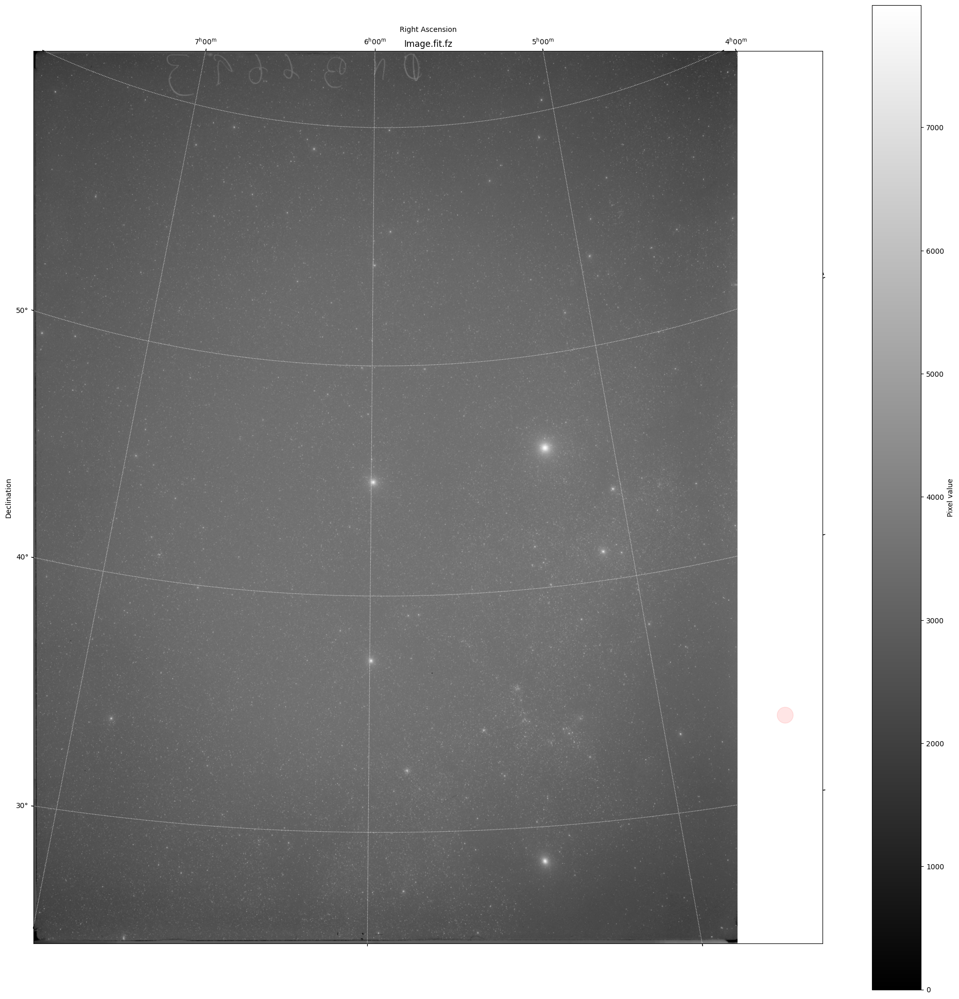

In [ ]:

ra = 69.10341465543844
dec = 33.205797514115154
file_path = "dnb06693.fit.fz" #These values change for every asteroid
 

hdul = fits.open(file_path)

wcs_2d = WCS(hdul[1].header)

image_data = hdul[1].data


# Convert RA/Dec to pixel coordinates
x, y = wcs_2d.world_to_pixel_values(ra, dec)

fig = plt.figure(figsize=(20, 20))

ax = plt.subplot(projection=wcs_2d)

ax.set_xlabel('Right Ascension')

ax.set_ylabel('Declination') 

ax.coords.grid(color='white', ls='dotted')
# Plot
plt.imshow(image_data, origin='lower', cmap='gray')
plt.scatter(x, y, c='red', s=500, alpha = 0.1)
plt.colorbar(im, ax=ax, label='Pixel value')
plt.title("Image.fit.fz")

plt.tight_layout()
plt.savefig("Imagename.png", dpi=600)
plt.show()



### Example 3

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
/var/folders/c5/4r_jvw5161b_6dvp_6v7p4qm0000gn/T/ipykernel_92615/3454244000.py:28: UserWarning: Adding colorbar to a different Figure <Figure size 2000x2000 with 2 Axes> than <Figure size 2000x2000 with 2 Axes> which fig.colorbar is called on.
  plt.colorbar(im, ax=ax, label='Pixel value')


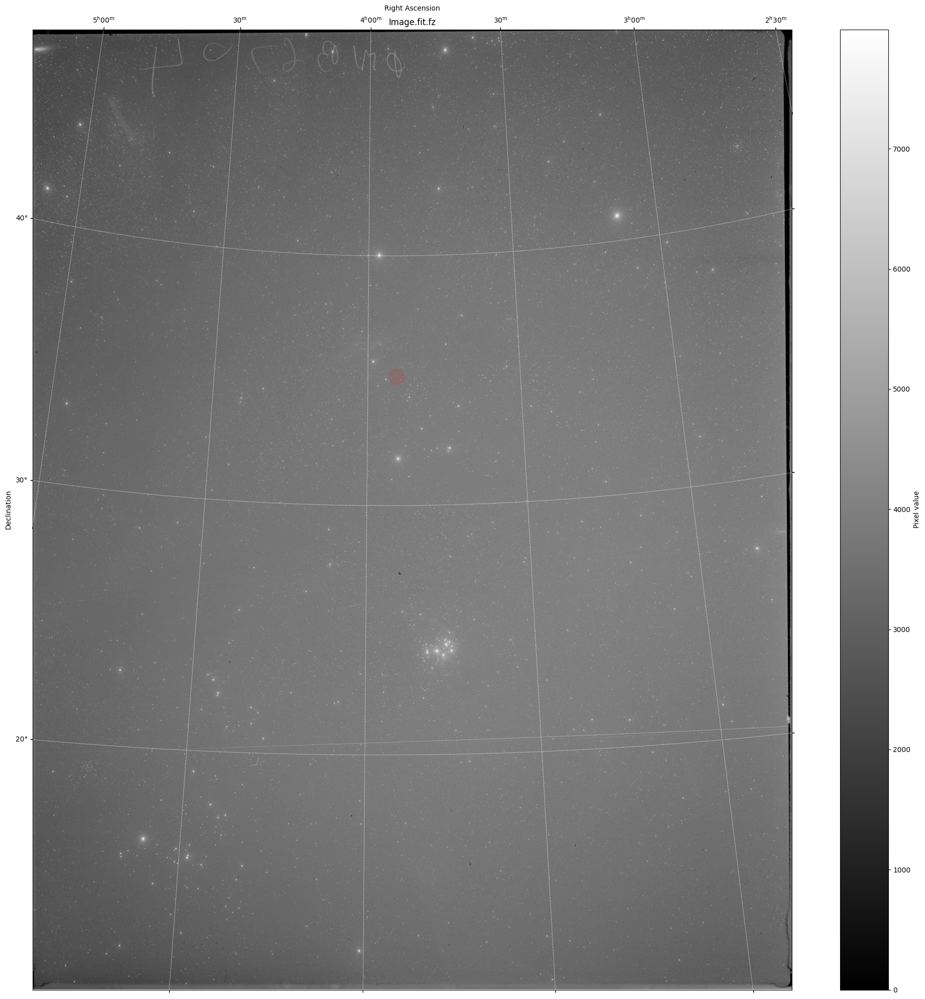

In [ ]:
ra = 58.585900499641745
dec = 35.20754230862338
file_path = "dnb06704.fit.fz" #These values change for every asteroid
 

hdul = fits.open(file_path)

wcs_2d = WCS(hdul[1].header)

image_data = hdul[1].data


# Convert RA/Dec to pixel coordinates
x, y = wcs_2d.world_to_pixel_values(ra, dec)

fig = plt.figure(figsize=(20, 20))

ax = plt.subplot(projection=wcs_2d)

ax.set_xlabel('Right Ascension')

ax.set_ylabel('Declination') 

ax.coords.grid(color='white', ls='dotted')
# Plot
plt.imshow(image_data, origin='lower', cmap='gray')
plt.scatter(x, y, c='red', s=500, alpha = 0.1)
plt.colorbar(im, ax=ax, label='Pixel value')
plt.title("Image.fit.fz")

plt.tight_layout()
plt.savefig("comandante.png", dpi=600)
plt.show()

### Example 4

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
/var/folders/c5/4r_jvw5161b_6dvp_6v7p4qm0000gn/T/ipykernel_92615/347545662.py:28: UserWarning: Adding colorbar to a different Figure <Figure size 2000x2000 with 2 Axes> than <Figure size 2000x2000 with 2 Axes> which fig.colorbar is called on.
  plt.colorbar(im, ax=ax, label='Pixel value')


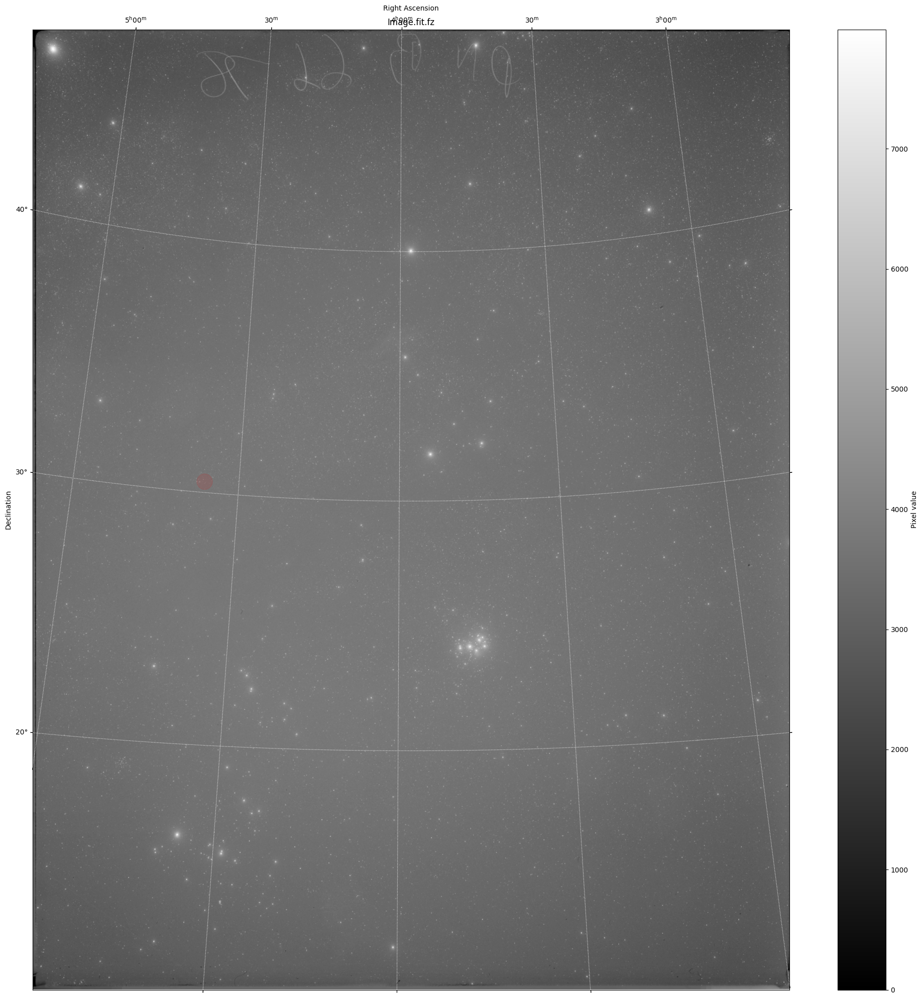

In [ ]:
ra = 69.10341465543844
dec = 30.430811855273916
file_path = "dnb06678.fit.fz" #These values change for every asteroid
 

hdul = fits.open(file_path)

wcs_2d = WCS(hdul[1].header)

image_data = hdul[1].data


# Convert RA/Dec to pixel coordinates
x, y = wcs_2d.world_to_pixel_values(ra, dec)

fig = plt.figure(figsize=(20, 20))

ax = plt.subplot(projection=wcs_2d)

ax.set_xlabel('Right Ascension')

ax.set_ylabel('Declination') 

ax.coords.grid(color='white', ls='dotted')
# Plot
plt.imshow(image_data, origin='lower', cmap='gray')
plt.scatter(x, y, c='red', s=500, alpha = 0.1)
plt.colorbar(im, ax=ax, label='Pixel value')
plt.title("Image.fit.fz")

plt.tight_layout()
plt.savefig("Imagename.png", dpi=600)
plt.show()